In [5]:
%pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 MB 12.2 MB/s eta 0:00:00m eta 0:00:010:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os, sys
import warnings
warnings.filterwarnings("ignore")

import cv2
import numpy as np


# image = "lion.png"
# image = "arch.png"
# image = "moto.png"
# image = "owl.png"
image = "bird.png"
# image = "train.png"

# Create a new directory to save resized images
output_dir = "resized_images"
os.makedirs(output_dir, exist_ok=True)

# List of images to resize
images = ["lion.png", "arch.png", "moto.png", "owl.png", "bird.png", "train.png"]

# Resize each image to 64x64 and save in the new directory
for img_name in images:
  img_path = os.path.join(f'images_to_compare/{img_name}')
  img = cv2.imread(img_path)
  if img is not None:
    resized_img = cv2.resize(img, (600, 500))
    cv2.imwrite(os.path.join(output_dir, img_name), resized_img)
  else:
    print(f"Failed to load image: {img_name}")



In [1]:
%pip install stegano

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 10.7 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: pillow
    Found existing installation: pillow 11.0.0
    Uninstalling pillow-11.0.0:
      Successfully uninstalled pillow-11.0.0
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import numpy as np
from PIL import Image, ImageChops
import secrets
import sys

def generate_random_text(length):
    """Generate a random text string of given length."""
    return ''.join(secrets.choice('ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789') 
                   for _ in range(length))

def text_to_bits(text):
    """Convert text to a binary string."""
    return ''.join(format(ord(c), '08b') for c in text)

def bits_to_text(bits):
    """Convert binary string back to text."""
    chars = [bits[i:i+8] for i in range(0, len(bits), 8)]
    return ''.join(chr(int(c, 2)) for c in chars if int(c, 2) != 0)

def embed_lsb(image_path, output_path, bpp=2):
    """Embed random text into an image using LSB with given BPP."""
    img = Image.open(image_path)
    img = img.convert('RGB')  # Ensure image is in RGB mode
    pixels = np.array(img)
    
    height, width, _ = pixels.shape
    max_capacity = height * width * 3 * bpp // 8  # Maximum bytes we can encode
    
    # Generate random text to fit the image capacity
    random_text = generate_random_text(max_capacity)
    binary_data = text_to_bits(random_text)  # Convert to binary
    
    if len(binary_data) > height * width * 3 * bpp:
        raise ValueError("Text is too large to fit in the image with given BPP.")
    
    data_index = 0
    for i in range(height):
        for j in range(width):
            for k in range(3):  # Iterate over RGB channels
                if data_index < len(binary_data):
                    pixel_bin = format(pixels[i, j, k], '08b')
                    new_pixel_bin = pixel_bin[:-bpp] + binary_data[data_index:data_index + bpp]
                    pixels[i, j, k] = int(new_pixel_bin, 2)
                    data_index += bpp
                else:
                    break
    
    stego_img = Image.fromarray(pixels)
    stego_img.save(output_path)
    print(f"Stego image saved to {output_path}")
    return random_text  # Return embedded text for verification

def extract_lsb(image_path, bpp=2, text_length=None):
    """Extract hidden text from an image using LSB with given BPP."""
    img = Image.open(image_path)
    img = img.convert('RGB')
    pixels = np.array(img)
    
    height, width, _ = pixels.shape
    binary_data = ""
    
    for i in range(height):
        for j in range(width):
            for k in range(3):  # Iterate over RGB channels
                binary_data += format(pixels[i, j, k], '08b')[-bpp:]
                if text_length and len(binary_data) >= text_length * 8:
                    break
    
    extracted_text = bits_to_text(binary_data)
    return extracted_text

# Example usage:
original_text = embed_lsb('bird.png', 'lsb_bird.png', bpp=2)
decoded_text = extract_lsb('lsb_bird.png', bpp=2, text_length=len(original_text))
print("Success!" if original_text == decoded_text else "Mismatch detected.")


Stego image saved to lsb_bird.png
Success!


Image difference saved to diff.png


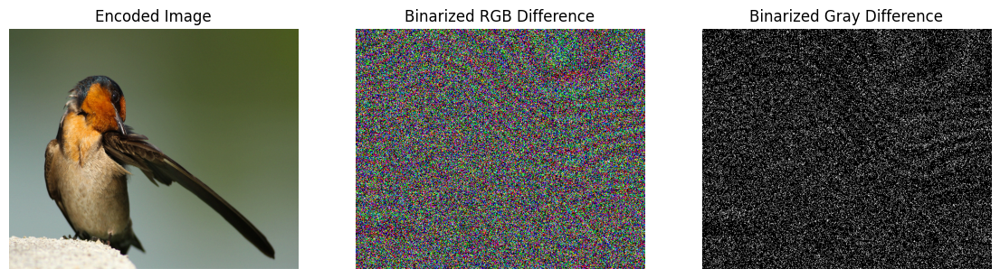

In [10]:
import cv2
import matplotlib.pyplot as plt

def image_difference(image_path1, image_path2, output_diff_path):
    """Compute the difference between two images and visualize it."""
    img1 = cv2.imread(image_path1)
    img2 = cv2.imread(image_path2)
    
    # Convert to grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    # Compute differences
    diff_rgb = cv2.absdiff(img1, img2)
    diff_gray = cv2.absdiff(gray1, gray2)
    
    # Binarize differences
    _, binarized_rgb = cv2.threshold(diff_rgb, 1, 255, cv2.THRESH_BINARY)
    _, binarized_gray = cv2.threshold(diff_gray, 1, 255, cv2.THRESH_BINARY)
    
    # Plot results
    fig, axes = plt.subplots(1, 3, figsize=(14, 5))
    titles = ["Encoded Image", "Binarized RGB Difference", "Binarized Gray Difference"]
    images = [cv2.cvtColor(img2, cv2.COLOR_BGR2RGB), binarized_rgb, binarized_gray]
    
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        ax.set_title(title)
        ax.axis('off')
    
    plt.savefig(output_diff_path)
    print(f"Image difference saved to {output_diff_path}")

image_difference('bird.png', 'lsb_bird.png', 'diff.png')

Comparison grid saved to 'bird_comparison.png'


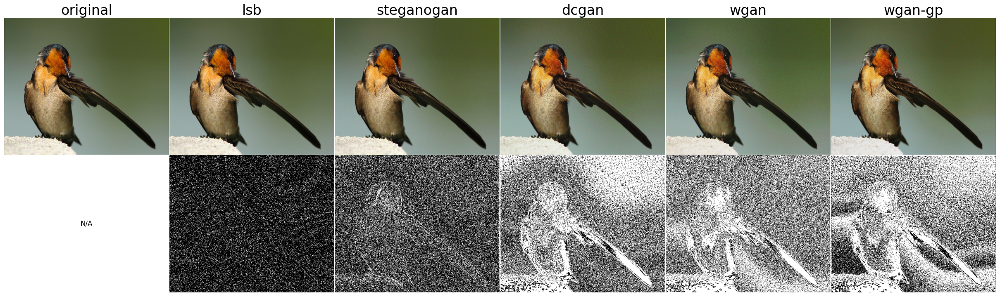

In [9]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def compute_gray_difference(original_path, compare_path):
    """Compute binarized gray difference between two images."""
    img1 = cv2.imread(original_path)
    img2 = cv2.imread(compare_path)
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    diff_gray = cv2.absdiff(gray1, gray2)
    _, binarized_gray = cv2.threshold(diff_gray, 1, 255, cv2.THRESH_BINARY)
    return img2, binarized_gray

def create_comparison_grid():
    original_path = 'bird_d2/bird.png'
    image_paths = [
        'bird_d2/bird.png',
        'bird_d2/lsb_bird.png',
        'bird_d2/steganogan_bird.png',
        'bird_d2/dcgan_bird_output.png',
        'bird_d2/wgan_bird_output.png',
        'bird_d2/wgan_gp_bird_output.png'
    ]
    labels = ['original', 'lsb', 'steganogan', 'dcgan', 'wgan', 'wgan-gp']
    
    # Create figure with 2 rows
    fig, axes = plt.subplots(2, 6, figsize=(24, 7))
    
    # First row: Images with larger labels above
    for ax, img_path, label in zip(axes[0], image_paths, labels):
        img = cv2.imread(img_path)
        if img is not None:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)
        ax.set_title(label, fontsize=24, pad=2)  # Збільшено fontsize з 12 до 16
        ax.axis('off')
        ax.set_aspect('equal')  # Preserve image aspect ratio
    
    # Second row: Binarized Gray Differences
    for ax, img_path in zip(axes[1], image_paths):
        if img_path == original_path:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center', fontsize=12)
            ax.axis('off')
            ax.set_aspect('equal')
        else:
            img, bin_gray = compute_gray_difference(original_path, img_path)
            if bin_gray is not None:
                ax.imshow(bin_gray, cmap='gray')
            ax.axis('off')
            ax.set_aspect('equal')
    
    # Tighten layout with no padding
    plt.tight_layout(pad=0, h_pad=0, w_pad=0.1)
    plt.savefig('bird_comparison.png', dpi=300, bbox_inches='tight', pad_inches=0)
    print("Comparison grid saved to 'bird_comparison.png'")

if __name__ == "__main__":
    create_comparison_grid()

Image grid saved to 'moto_images.png'


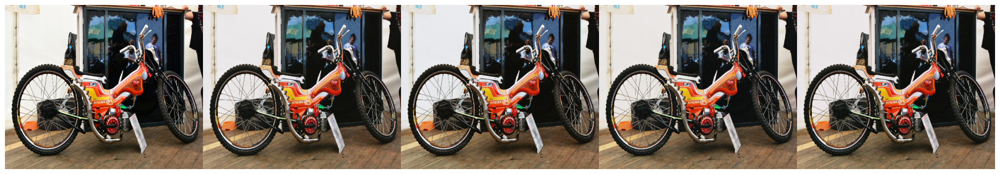

In [7]:
import cv2
import matplotlib.pyplot as plt

def display_images():
    # Image paths, with moto.png first
    image_paths = [
        'moto_wgan_gp/moto.png',      # Original
        'moto_wgan_gp/moto_d1.png',
        'moto_wgan_gp/moto_d2.png',
        'moto_wgan_gp/moto_d3.png',
        'moto_wgan_gp/moto_d4.png'
    ]
    
    # Create figure with 1 row and 5 columns
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))  # Adjusted size for 5 images
    
    # Display each image
    for ax, img_path in zip(axes, image_paths):
        img = cv2.imread(img_path)
        if img is not None:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)
        ax.axis('off')  # No axes
        ax.set_aspect('equal')  # Preserve aspect ratio
    
    # Tighten layout with no padding
    plt.tight_layout(pad=0, w_pad=0)
    plt.savefig('moto_images.png', dpi=300, bbox_inches='tight', pad_inches=0)
    print("Image grid saved to 'moto_images.png'")

if __name__ == "__main__":
    display_images()

Image grid saved to 'wgan_gp_comparison.png'


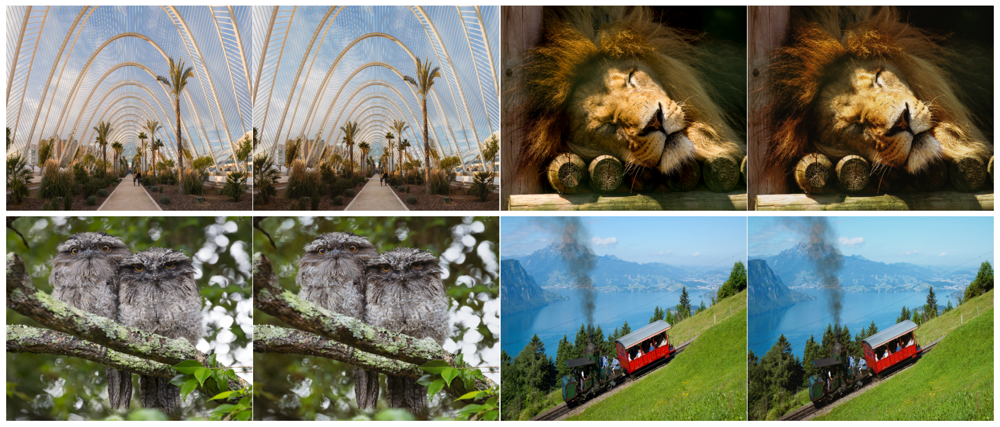

In [16]:
import cv2
import matplotlib.pyplot as plt

def display_image_pairs():
    # Define image pairs (original and wgan_gp versions)
    image_pairs = [
        ('wgan_gp_different_images/arch.png', 'wgan_gp_different_images/arch_wgan_gp.png'),
        ('wgan_gp_different_images/lion.png', 'wgan_gp_different_images/lion_wgan_gp.png'),
        ('wgan_gp_different_images/owl.png', 'wgan_gp_different_images/owl_wgan_gp.png'),
        ('wgan_gp_different_images/train.png', 'wgan_gp_different_images/train_wgan_gp.png')
    ]
    
    # Create figure with 2 rows and 4 columns
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 cols total
    
    # Flatten axes for easier iteration
    axes = axes.flatten()
    
    # Counter for axes index
    ax_idx = 0
    
    # Display each pair
    for orig_path, wgan_path in image_pairs:
        # Original image (left)
        orig_img = cv2.imread(orig_path)
        if orig_img is not None:
            orig_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
            axes[ax_idx].imshow(orig_rgb)
        axes[ax_idx].axis('off')
        axes[ax_idx].set_aspect('equal')
        ax_idx += 1
        
        # WGAN-GP image (right)
        wgan_img = cv2.imread(wgan_path)
        if wgan_img is not None:
            wgan_rgb = cv2.cvtColor(wgan_img, cv2.COLOR_BGR2RGB)
            axes[ax_idx].imshow(wgan_rgb)
        axes[ax_idx].axis('off')
        axes[ax_idx].set_aspect('equal')
        ax_idx += 1
    
    # Tighten layout with even less vertical spacing
    plt.tight_layout(pad=0, h_pad=-4.5, w_pad=0.1)  # Negative h_pad to reduce row spacing
    plt.savefig('wgan_gp_comparison.png', dpi=300, bbox_inches='tight', pad_inches=0)
    print("Image grid saved to 'wgan_gp_comparison.png'")

if __name__ == "__main__":
    display_image_pairs()